In [19]:
from pycaret.datasets import get_data
from pycaret.classification import *
from sklearn.model_selection import train_test_split
import pandas_profiling as pp
import pandas as pd
import numpy as np

In [21]:
df = get_data(dataset = 'telescope', profile=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
df = df.dropna()
df = df.drop_duplicates()
df

,fLength,fWidth,fSize,fConc,fConcl,fAsym,fM3Long,fM3Trans,fAlpha,fDist,Class
0,28.7967,16.0021,2.6449,0.3918,0.1982,27.7004,22.0110,-8.2027,40.0920,81.8828,g
1,31.6036,11.7235,2.5185,0.5303,0.3773,26.2722,23.8238,-9.9574,6.3609,205.2610,g
2,162.0520,136.0310,4.0612,0.0374,0.0187,116.7410,-64.8580,-45.2160,76.9600,256.7880,g
3,23.8172,9.5728,2.3385,0.6147,0.3922,27.2107,-6.4633,-7.1513,10.4490,116.7370,g
4,75.1362,30.9205,3.1611,0.3168,0.1832,-5.5277,28.5525,21.8393,4.6480,356.4620,g
...,...,...,...,...,...,...,...,...,...,...,...
19015,21.3846,10.9170,2.6161,0.5857,0.3934,15.2618,11.5245,2.8766,2.4229,106.8258,h
19016,28.9452,6.7020,2.2672,0.5351,0.2784,37.0816,13.1853,-2.9632,86.7975,247.4560,h
19017,75.4455,47.5305,3.4483,0.1417,0.0549,-9.3561,41.0562,-9.4662,30.2987,256.5166,h
19018,120.5135,76.9018,3.9939,0.0944,0.0683,5.8043,-93.5224,-63.8389,84.6874,408.3166,h


In [ ]:
repl = {'g' : 0, 'h' : 1}
df = df.replace({'Class' : repl})
df

,fLength,fWidth,fSize,fConc,fConcl,fAsym,fM3Long,fM3Trans,fAlpha,fDist,Class
0,28.7967,16.0021,2.6449,0.3918,0.1982,27.7004,22.0110,-8.2027,40.0920,81.8828,0
1,31.6036,11.7235,2.5185,0.5303,0.3773,26.2722,23.8238,-9.9574,6.3609,205.2610,0
2,162.0520,136.0310,4.0612,0.0374,0.0187,116.7410,-64.8580,-45.2160,76.9600,256.7880,0
3,23.8172,9.5728,2.3385,0.6147,0.3922,27.2107,-6.4633,-7.1513,10.4490,116.7370,0
4,75.1362,30.9205,3.1611,0.3168,0.1832,-5.5277,28.5525,21.8393,4.6480,356.4620,0
...,...,...,...,...,...,...,...,...,...,...,...
19015,21.3846,10.9170,2.6161,0.5857,0.3934,15.2618,11.5245,2.8766,2.4229,106.8258,1
19016,28.9452,6.7020,2.2672,0.5351,0.2784,37.0816,13.1853,-2.9632,86.7975,247.4560,1
19017,75.4455,47.5305,3.4483,0.1417,0.0549,-9.3561,41.0562,-9.4662,30.2987,256.5166,1
19018,120.5135,76.9018,3.9939,0.0944,0.0683,5.8043,-93.5224,-63.8389,84.6874,408.3166,1


In [ ]:
profile = pp.ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
train, test = train_test_split(df, test_size=0.1, random_state=42, shuffle=True)

In [ ]:
dataset = setup(data = train, target = 'Class', normalize = True, preprocess = True, ignore_features = [""])

,Description,Value
0,Session id,1264
1,Target,Class
2,Target type,Binary
3,Original data shape,"(17014, 11)"
4,Transformed data shape,"(17014, 11)"
5,Transformed train set shape,"(11909, 11)"
6,Transformed test set shape,"(5105, 11)"
7,Ignore features,1
8,Numeric features,10
9,Preprocess,True


In [ ]:
best = create_model('lightgbm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8581,0.9272,0.7215,0.8466,0.7791,0.6755,0.6802
1,0.8766,0.9355,0.7433,0.8822,0.8068,0.7171,0.7228
2,0.8799,0.9379,0.7554,0.8814,0.8136,0.7258,0.7305
3,0.8950,0.9441,0.7864,0.8975,0.8383,0.7611,0.7647
4,0.8875,0.9396,0.7840,0.8777,0.8282,0.7450,0.7476
5,0.8825,0.9363,0.7573,0.8864,0.8168,0.7310,0.7359
6,0.8564,0.9119,0.7330,0.8320,0.7794,0.6736,0.6765
7,0.8833,0.9369,0.7573,0.8889,0.8178,0.7328,0.7379
8,0.8816,0.9279,0.7816,0.8633,0.8204,0.7324,0.7344


In [ ]:
tuned_best = tune_model(estimator = best)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,10:48:09
Status,. . . . . . . . . . . . . . . . . .,Searching Hyperparameters
Estimator,. . . . . . . . . . . . . . . . . .,Light Gradient Boosting Machine


Fitting 10 folds for each of 10 candidates, totalling 100 fits


KeyboardInterrupt: 

In [ ]:
predictions = predict_model(tuned_best, data=test)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,CatBoost Classifier,0.8895,0.9450,0.7892,0.8924,0.8376,0.7543,0.7576


In [ ]:
predictions

,fLength,fWidth,fSize,fConc,fConcl,fAsym,fM3Long,fM3Trans,fAlpha,fDist,Class,prediction_label,prediction_score
2388,20.800301,9.504500,2.2405,0.6264,0.3764,-4.799100,15.680500,-10.512100,63.597500,131.828995,0,0,0.9298
14735,14.614800,9.281600,2.4972,0.6027,0.3788,-1.291300,-18.550100,8.893000,36.593399,66.066002,1,1,0.9633
4489,89.323402,31.065901,3.2227,0.1473,0.0793,-112.503998,-59.035900,-24.671801,9.352100,220.389008,0,0,0.6965
14214,25.849899,8.508600,2.5308,0.5626,0.3667,12.259500,10.393200,-4.457200,68.843002,165.671005,1,1,0.9700
4156,41.978199,22.138700,2.8748,0.3042,0.1621,31.181999,25.391300,19.025900,20.596600,139.298996,0,0,0.8927
...,...,...,...,...,...,...,...,...,...,...,...,...,...
13050,26.082199,10.772900,2.6294,0.5023,0.2805,-6.285100,-14.265200,8.852500,79.510002,181.639008,1,1,0.9510
6234,25.855600,14.431800,2.2648,0.6141,0.3777,23.675301,16.553801,-11.027900,12.209500,133.171005,0,0,0.8728
6027,39.079800,20.013901,2.9643,0.2530,0.1341,7.615400,9.834800,-12.768300,15.729300,220.279007,0,0,0.9224
15659,77.249298,46.128300,3.6997,0.1016,0.0512,71.622299,-39.890099,27.597500,59.251598,134.391998,1,1,0.9372


In [ ]:
evaluate_model(tuned_best)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

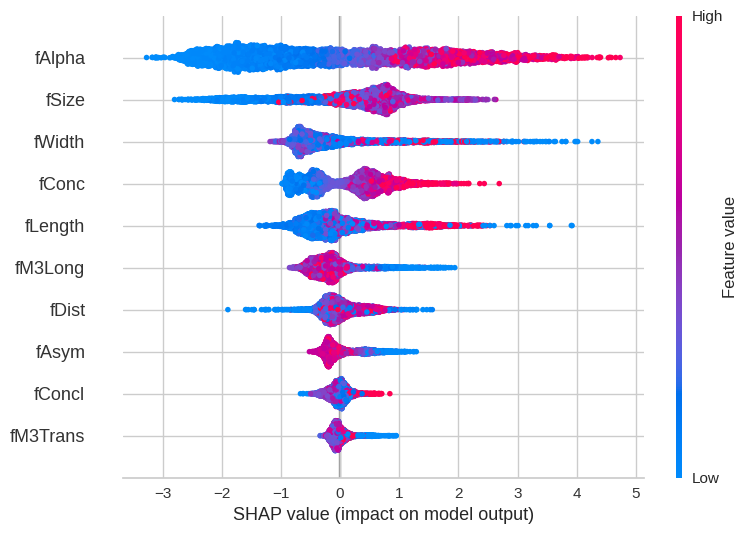

In [ ]:
interpret_model(tuned_best)

In [ ]:
final_model = finalize_model(tuned_best)

In [ ]:
save_model(final_model,"telescope")

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['fLength', 'fWidth', 'fSize',
                                              'fConc', 'fConcl', 'fAsym',
                                              'fM3Long', 'fM3Trans', 'fAlpha',
                                              'fDist'],
                                     transformer=SimpleImputer(add_indicator=False,
                                                               copy=True,
                                                               fill_value=None,
                                                               keep_empty_features=False,
                                                               missing_values=nan,
                                                               strategy='mean',
                                                               verbose='deprecated...
        